<h1 align="center">Volume 2: The Fourier Transform.</h1>

    <Name>
    <Class>
    <Date>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [24]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy.fftpack import fft,ifft,fft2,ifft2
from scipy.signal import fftconvolve
import time

In [25]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [26]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        
        self.rate = rate
        self.samples = samples
        #raise NotImplementedError("Problem 1.1 Incomplete")

    # Problems 1.1 and 1.7
    def plot(self, bool = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        if bool == False:
            seconds = len(self.samples)/(self.rate)
            x = np.linspace(0,seconds,len(self.samples))
            plt.plot(x,self.samples)
            plt.ylabel("Samples")
            plt.xlabel("Seconds")
            plt.ylim(-32768,32767)
            plt.show()
        else:   
            dft = fft(self.samples)
            magnitude = np.abs((dft-self.rate)/ len(dft))
            frequency = np.linspace(0,self.rate//2,self.rate//2)
            A2 = plt.subplot(122)
            A2.plot(freqeuncy,magnitude[self.rate//2])
        
            
        #raise NotImplementedError("Problem 1.1 Incomplete")

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        if self.samples.dtype != "int16" or force == True: 
            self.samples = np.int16(((self.samples)/max(self.samples))*32767)
            
        wavfile.write(filename,self.rate,self.samples)
        #raise NotImplementedError("Problem 1.2 Incomplete")
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        self.new = []
        if len(self.samples) != len(other.samples):
            raise(ValueError("two arrays are not the same length"))
        for i in range(len(self.samples)):
            self.new.append(int(self.samples[i]) + int(other.samples[i]))
        #self.new = self.samples + other.samples
        self.new = np.array(self.new)
        new_sound = SoundWave(self.rate,self.new)
        return new_sound
        #raise NotImplementedError("Problem 1.4 Incomplete")

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:
            raise(ValueError("The rates are not the same"))
        self.new = np.concatenate((self.samples,other.samples))
        new_sound = SoundWave(self.rate,self.new)
        return new_sound
        #raise NotImplementedError("Problem 1.4 Incomplete")
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check if rates are the same
        if self.rate != other.rate:
            raise(ValueError("Rates are not the same"))
        #append zeros to the shorter array    
        if len(self.samples) > len(other.samples):
            zeros = np.zeros(len(self.samples)-len(other.samples))
            other.samples = np.concatenate((other.samples,zeros))
        if len(other.samples) > len(self.samples):
            zeros = np.zeros(len(other.samples)-len(self.samples))
            self.samples = np.concatenate((self.samples,zeros))
        #find the DFT of each
        self_hat = fft(self.samples)
        other_hat = fft(other.samples)
        #multiply component wise
        multiply = np.multiply(self_hat,other_hat)
        return ifft(multiply).real
        #raise NotImplementedError("Problem 2.1 Incomplete")

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        #check if the rates match
        if self.rate != other.rate: #check that the rates are the same
            raise(ValueError("Rates are not the same"))
        #define variables
        n = len(self.samples)
        m = len(other.samples)
        #find a
        a = 0
        while 2**a < (n + m - 1):
            a += 1
        #create 0 vectors that when added to the original samples will be 2**a in length
        nzeros = np.zeros((2**a)-n)
        mzeros = np.zeros((2**a)-m)
        sound1 = np.concatenate((self.samples,nzeros))
        sound2 = np.concatenate((other.samples,mzeros))
        #convolute these 2 padded samples
        one = SoundWave(self.rate,sound1)
        two = SoundWave(other.rate,sound2)
        convolution = SoundWave.__mul__(one,two)
        return convolution[:(n+m-1)]
        
        #raise NotImplementedError("Problem 2.2 Incomplete")

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        #take the DFT
        dft = fft(self.samples)
        r = self.rate
        n = len(self.samples)
        #find the high and low indices that we will want to remove
        k_high = (high_freq*n)/r
        k_low = (low_freq*n)/r
        new = dft.copy()
        #cycle through the array and set the values to zero that are in the range k_low-k_high and (n-k_high)-(n-k_low)
        for i in range(len(dft)):
            if k_low <= i and i <= k_high:
                new[i] = 0
            elif ((n-k_high) <= i and i <= (n-k_low)):
                new[i] = 0
        #return the inverse DFT of the result
        return ifft(new).real

        
        #raise NotImplementedError("Problem 2.4 Incomplete")
                                  
    

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavfile.read()` and the `SoundWave` class to plot `tada.wav`.

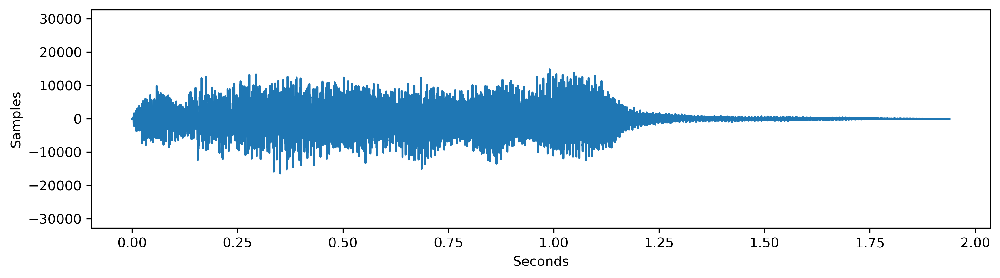

In [27]:
rate, samples = wavfile.read("tada.wav")
A = SoundWave(rate,samples)
A.plot()

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [28]:
rate, samples = wavfile.read("tada.wav")
A = SoundWave(rate,samples)
A.export("tada2.wav")
A.export("tadaScaled.wav",True)
IPython.display.Audio("tada.wav")

In [29]:
IPython.display.Audio("tada2.wav")

In [30]:
IPython.display.Audio("tadaScaled.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [31]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    rate = 44100
    x = np.linspace(0,duration,(rate*duration))
    f = np.sin(2*np.pi*x*frequency)
    A = SoundWave(rate,f)
    A.export("test.wav")
    return A, IPython.display.Audio("test.wav")
    #raise NotImplementedError("Problem 1.3 Incomplete")

In [32]:
generate_note(440,2)[1]

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [33]:
A = generate_note(440,3)[0]
C = generate_note(523.25,3)[0]
E = generate_note(659.25,3)[0]
AC = SoundWave.__add__(A,C)
ACE = SoundWave.__add__(AC,E)
ACE.export("test.wav")
IPython.display.Audio("test.wav")

In [34]:


"""  I coded the first 2 measures of the song Imagine by John Lennon. Not a perfect rendition, (idk if I got 
the sharps right and the timing is awful), but if you uncomment this you can listen and it's not
half bad 

E = generate_note(659.25,1)[0]
G = generate_note(783.99,1)[0]
C = generate_note(523.25,1)[0]
B = generate_note(987.76,1)[0]
F = generate_note(698.46,1)[0]
A = generate_note(880,1)[0]
A_sharp = generate_note(932.32,1)[0]
A_As = SoundWave.__rshift__(A,A_sharp)
A_As_B = SoundWave.__rshift__(A_As,B)
EG = SoundWave.__add__(E,G)
EGB = SoundWave.__add__(EG,B)
FA = SoundWave.__add__(F,A)
FA_C = SoundWave.__rshift__(FA,C)
FA_C2 = SoundWave.__rshift__(FA_C,FA_C)
FA_C3 = SoundWave.__rshift__(FA_C2,FA_C)
EGB_C = SoundWave.__rshift__(EGB,C)
EG_C = SoundWave.__rshift__(EG,C)
X2 = SoundWave.__rshift__(EG_C,EG_C)
X3 = SoundWave.__rshift__(X2,EG_C)
X4 = SoundWave.__rshift__(X3,EGB_C)
X5 = SoundWave.__rshift__(X4,FA_C3)
X6 = SoundWave.__rshift__(X5,A_As_B)
Final = SoundWave.__rshift__(X6,X6)
Final.export("test.wav")
IPython.display.Audio("test.wav")  """  

A = generate_note(440,1)[0]
C = generate_note(523.25,1)[0]
E = generate_note(659.25,1)[0]
AC = SoundWave.__rshift__(A,C)
ACE = SoundWave.__rshift__(AC,E)
ACE.export("test.wav")
IPython.display.Audio("test.wav") 

### Problem 1.5

- Implement `simple_dft()` with the formula $c=F_nf$, where $F_n$ is the n-dimensional DFT matrix.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [35]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    Fn = np.ones((n,n))
    wn = np.exp((2*np.pi*1j)/n)
    for i in range(n):
        for j in range(n):
            Fn[i][j] = wn**(n-((i*j)%n))
    Fn = (1/n)*Fn
    DFT = np.matmul(Fn,samples)
    return DFT
    
    #raise NotImplementedError("Problem 1.5 Incomplete")

In [36]:
A = simple_dft([1,1,0,0])
B = fft([1,1,0,0])
np.allclose(A,B,atol=1e-15)

<ipython-input-35-2a4c05074fe1>:15: ComplexWarning: Casting complex values to real discards the imaginary part
  Fn[i][j] = wn**(n-((i*j)%n))


False

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [37]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):
        n = len(g)
        if n <= threshold:
            return simple_dft(g)
        else:
            even = split(g[::2])
            odd = split(g[1::2])
            z = np.exp(np.arange(n) * (-2j*np.pi/n))
            m = n//2
            A = even + z[:m] * odd
            B = even + z[m:] * odd
            return np.concatenate((A,B))
    return split(samples)/len(samples)
    #raise NotImplementedError("Problem 1.6 Incomplete")

In [38]:
f = np.empty(8192,dtype = np.int16)
%time dft = simple_dft(f)
%time fft = simple_fft(f)
%time sci = fft(f)

<ipython-input-35-2a4c05074fe1>:15: ComplexWarning: Casting complex values to real discards the imaginary part
  Fn[i][j] = wn**(n-((i*j)%n))


KeyboardInterrupt: 

Wall time: 285 ms


TypeError: 'numpy.ndarray' object is not callable

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

In [23]:
A = generate_note(440,3)
B = SoundWave(A[0],A[1])
B.plot(True)

TypeError: float() argument must be a string or a number, not 'Audio'

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

In [39]:
from scipy.signal import find_peaks
from scipy.fftpack import fft

rate,samples = wavfile.read("mystery_chord.wav")
print(samples)
x = [1,2,3,4,5]
A = fft([1,1,0,0])
magnitudes = np.abs(fft((samples)))
n = magnitudes.shape[0]
x = np.arange(n) * rate / n
indices = find_peaks(magnitudes, threshold = 5000)[0]
print(x[indices[0]], x[indices[1]], x[indices[2]], x[indices[3]])



[    0  2733  5445 ... -7734 -6309 -4836]
440.0 523.25 587.5 784.0


In [ ]:
print("The values are ", x[indices[0]], ", which corresponds to an A.", '\n', x[indices[1]], ", which corresponds to a C.", '\n', x[indices[2]], ", which corresponds to a D",'\n', "And a ", x[indices[3]], ", which corresponds to a G.", '\n',  "Therefore the chord is a A, C, D, and G") 

The notes are...

<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

In [40]:
rate, samples = wavfile.read("tada.wav")
#create a white noise
white_noise = np.random.randint(-32767,32767,rate*4,dtype=np.int16)
white_noise = SoundWave(rate,white_noise)
tada = SoundWave(rate,samples)

In [41]:
#convolve the white noise with the tada.wav
A = SoundWave.__mul__(white_noise,tada)
#A = white_noise*tada
C = np.concatenate((A,A))
result = SoundWave(rate,C)
result.export("test.wav")
IPython.display.Audio("test.wav") 

### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

In [42]:
rate,samples = wavfile.read("CGC.wav")
rate2,samples2 = wavfile.read("GCG.wav")
CGC = SoundWave(rate,samples)
GCG = SoundWave(rate2,samples2)
CGC.export("test.wav")
IPython.display.Audio("test.wav")
#this is the CGC sound

In [97]:
GCG.export("test.wav")
IPython.display.Audio("test.wav")
#this is the GCG sound

In [22]:
#convolve CGC and GCG using the pow function
GGG = SoundWave.__pow__(CGC,GCG)
result = SoundWave(rate,GGG)
result.export("test.wav")
IPython.display.Audio("test.wav")

In [43]:
#convolve CGC and GCG using the scipy fftconvolve function
GGG = fftconvolve(CGC,GCG)
result = SoundWave(rate,GGG)
result.export("test.wav")
IPython.display.Audio("test.wav")

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [44]:
rate,samples = wavfile.read("chopin.wav")
rate2,samples2 = wavfile.read("balloon.wav")
chopin = SoundWave(rate,samples)
balloon = SoundWave(rate2,samples2)
chopin.export("test.wav")
IPython.display.Audio("test.wav")
#This is the original chopin file

In [25]:
balloon.export("test.wav")
IPython.display.Audio("test.wav")
#This is the original balloon sound

In [45]:
#chopin_balloon = SoundWave.__pow__(chopin,balloon)
#convolve the functions using the scipy function
chopin_balloon = fftconvolve(chopin,balloon)
result = SoundWave(rate,chopin_balloon)
result.export("test.wav")
IPython.display.Audio("test.wav")
#enjoy the result ~~~~~~~~~~

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

In [46]:
rate,samples = wavfile.read("noisy1.wav")
noisy1 = SoundWave(rate,samples)
#clean the first noisy file
new = noisy1.clean(1250,2600)
result = SoundWave(rate,new)
result.export("test.wav")
IPython.display.Audio("test.wav")
#"One small step for man"

In [8]:
rate,samples = wavfile.read("noisy2.wav")
noisy2 = SoundWave(rate,samples)
#clean the second file
new = noisy2.clean(1302,4342)
result = SoundWave(rate,new)
result.export("test.wav")
IPython.display.Audio("test.wav")
#"the only thing we have to fear is fear itself" -FDR

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [14]:
rate,samples = wavfile.read("vuvuzela.wav")
vuvuzela = SoundWave(rate,samples)
#split the matrix into 2 column vectors
col1 = samples[:,0]
col2 = samples[:,1]
vuvuzela.export("test.wav")
IPython.display.Audio("test.wav")
#this is the original vuvuzela sound

In [15]:
vuvuzela1 = SoundWave(rate,col1)
vuvuzela1.export("test.wav")
IPython.display.Audio("test.wav")
#This is the original first column of the vuvuzela sound

In [16]:
vuvuzela2 = SoundWave(rate,col2)
vuvuzela2.export("test.wav")
IPython.display.Audio("test.wav")
#This is the original second column of the vuvuzela sound (they sound the same to me)

In [18]:
#clean both function and make them int16
one = vuvuzela1.clean(200,500)
one = np.int16(((one)/max(one))*32767)
two = vuvuzela2.clean(200,500)
two = np.int16(((two)/max(two))*32767)
#recombine
three = np.column_stack((one,two))
four = SoundWave(rate,three)
four.export("test.wav")
IPython.display.Audio("test.wav")
#This is the sound of both columns cleaned and then recombines

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

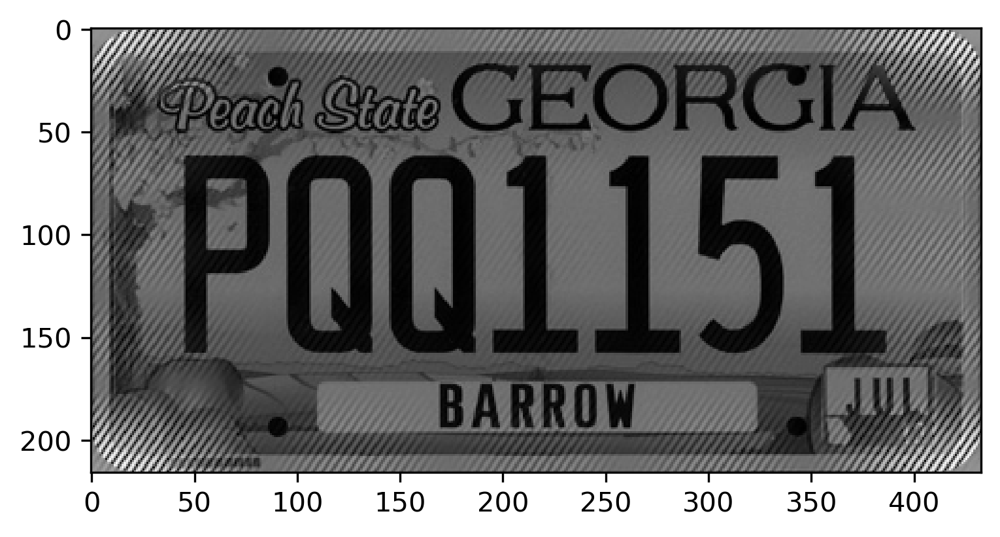

In [35]:
import imageio
image = imageio.imread("license_plate.png")
plt.imshow(image,cmap = "gray")
plt.show()
#This is what the original license plate image looks like

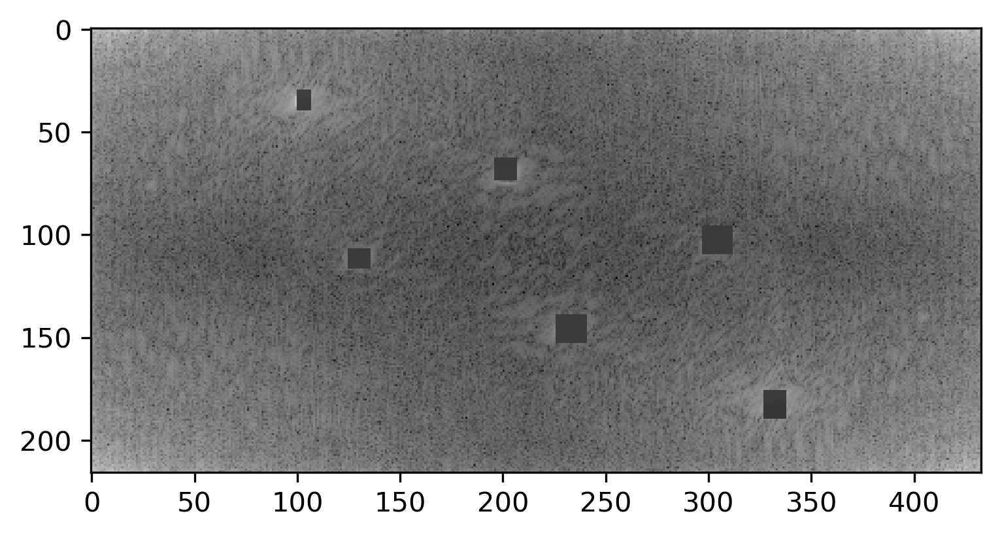

In [42]:
#take the dft
dft = fft2(image)
#remove the abnormalities
for i in range(30,40):
    for j in range(100,107):
        dft[i][j] = np.mean(dft)
        
for i in range(63,74):
    for j in range(196,207):
        dft[i][j] = np.mean(dft)
        
for i in range(107,117):
    for j in range(125,136):
        dft[i][j] = np.mean(dft)
        
for i in range(139,153):
    for j in range(226,241):
        dft[i][j] = np.mean(dft)
        
for i in range(96,110):
    for j in range(297,312):
        dft[i][j] = np.mean(dft)

for i in range(176,190):
    for j in range(327,338):
        dft[i][j] = np.mean(dft)

plt.imshow(np.log(np.abs(dft)),cmap = "gray")
#This is what the DFT graph looks like now

The year on the sticker is...

The sticker is July of 2013, see:


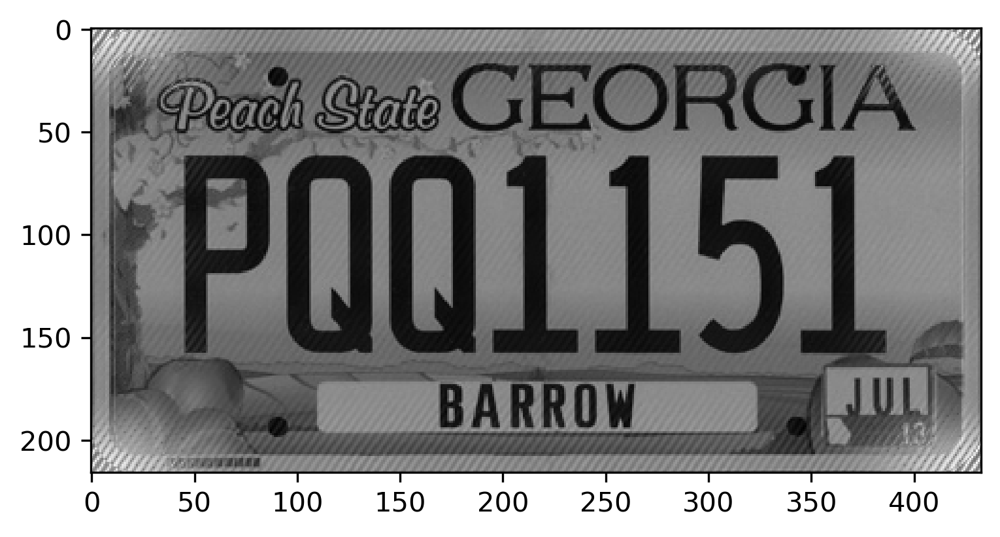

In [41]:
print("The sticker is July of 2013, see:")
#plot the ifft2 of the dft
ifft = ifft2(dft).real
plt.imshow(ifft,cmap = "gray")
plt.show()   
#much clearer image